In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pip install keras-tuner --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 3.6 MB/s eta 0:00:00


In [ ]:
#import librarires

import kerastuner as kt
from tensorflow import keras
import tensorflow as tf
from kerastuner.tuners import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameter as hp
from keras.layers import Dense,Dropout,Activation,Add,MaxPooling2D,Conv2D,Flatten,BatchNormalization
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
from keras.applications import VGG16


<ipython-input-3-a8e1b4a0a2de>:3: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  import kerastuner as kt


In [ ]:
from keras.applications import VGG16
from keras.models import Sequential
from keras.layers import Dense, Dropout, GlobalAveragePooling2D
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import preprocess_input
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    vertical_flip=True,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    preprocessing_function=preprocess_input,
    fill_mode='nearest',
    brightness_range = (0.5, 1.5),
)

batch_size = 32

# Load and preprocess data
train_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/train',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='binary',shuffle=True,seed=1
)

validation_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/valid',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='binary',shuffle=True,seed=1
)

test_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='binary',shuffle=True,seed=1
)

Found 930 images belonging to 2 classes.
Found 218 images belonging to 2 classes.
Found 135 images belonging to 2 classes.


In [ ]:
class_names = ["plain","pothole"]
for i in range(len(class_names)):
    print(i," ",class_names[i])

0   plain
1   pothole


In [ ]:
vgg_model =  VGG16(include_top=True , weights='imagenet')
for models in vgg_model.layers:
  models.trainable= False
vgg_model = keras.Model(inputs=vgg_model.input, outputs=vgg_model.layers[-2].output)
model = keras.Sequential()
for layer in vgg_model.layers:
  model.add(layer)
model.add(Dense(2048, activation='relu'))
model.add(Dropout(0.35))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(2, activation='softmax'))
model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)      

In [ ]:
#compile the model

model.compile(optimizer="adam", loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

#early stopping function
early = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5)

In [ ]:
# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,  # You can change the number of epochs based on your requirement
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size
)


Epoch 1/20
13/29 [============>.................] - ETA: 10s - loss: 2.7020 - accuracy: 0.4793

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


29/29 [==============================] - 38s 1s/step - loss: 1.6711 - accuracy: 0.5134 - val_loss: 0.6847 - val_accuracy: 0.5000
Epoch 2/20
29/29 [==============================] - 29s 1s/step - loss: 0.7250 - accuracy: 0.5690 - val_loss: 0.4694 - val_accuracy: 0.8802
Epoch 3/20
29/29 [==============================] - 30s 1s/step - loss: 0.4558 - accuracy: 0.7929 - val_loss: 0.2259 - val_accuracy: 0.9010
Epoch 4/20
29/29 [==============================] - 29s 998ms/step - loss: 0.3167 - accuracy: 0.8797 - val_loss: 0.2064 - val_accuracy: 0.9219
Epoch 5/20
29/29 [==============================] - 29s 1s/step - loss: 0.2369 - accuracy: 0.9187 - val_loss: 0.1802 - val_accuracy: 0.9427
Epoch 6/20
29/29 [==============================] - 29s 1000ms/step - loss: 0.3089 - accuracy: 0.8675 - val_loss: 0.2149 - val_accuracy: 0.9115
Epoch 7/20
29/29 [==============================] - 29s 1s/step - loss: 0.2668 - accuracy: 0.8842 - val_loss: 0.2209 - val_accuracy: 0.9115
Epoch 8/20
29/29 [======

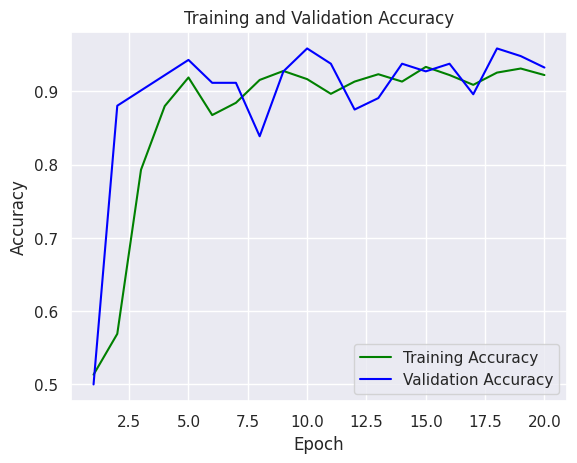

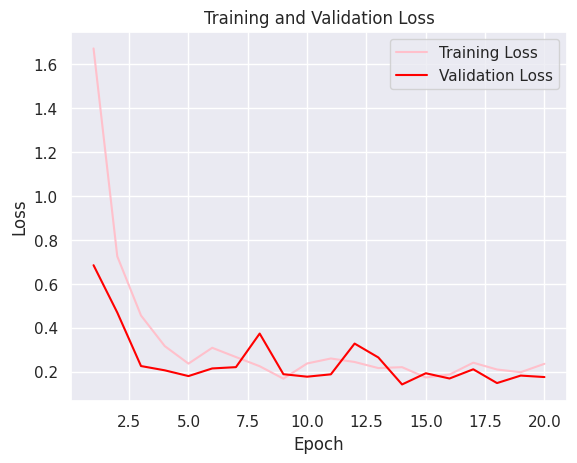

In [ ]:
#plotting training values
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)

#accuracy plot
plt.plot(epochs, acc, color='green', label='Training Accuracy')
plt.plot(epochs, val_acc, color='blue', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

plt.figure()
#loss plot
plt.plot(epochs, loss, color='pink', label='Training Loss')
plt.plot(epochs, val_loss, color='red', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

1/1 [==============================] - 0s 100ms/step


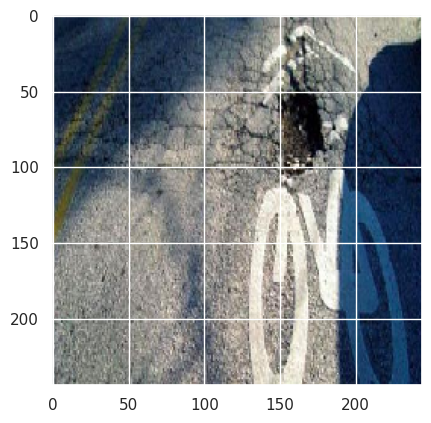

Predicted: Pothole
1/1 [==============================] - 0s 27ms/step


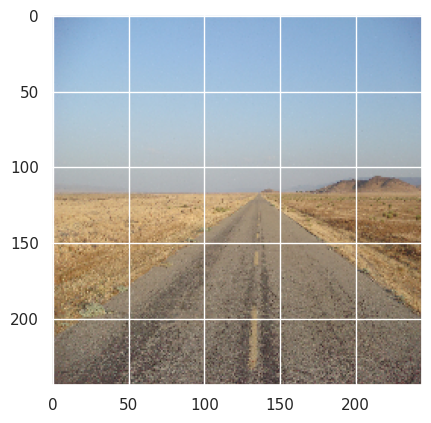

Predicted: Plain
1/1 [==============================] - 0s 20ms/step


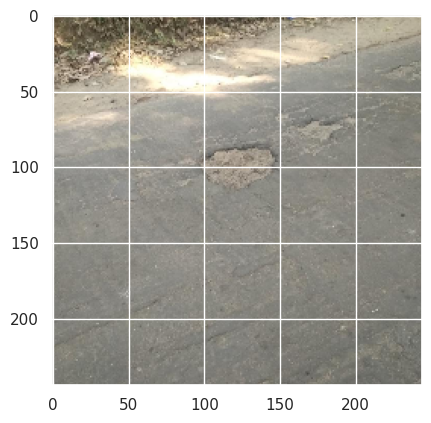

Predicted: Pothole
1/1 [==============================] - 0s 19ms/step


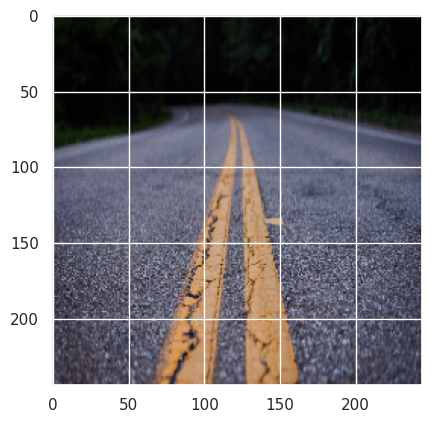

Predicted: Plain
1/1 [==============================] - 0s 29ms/step


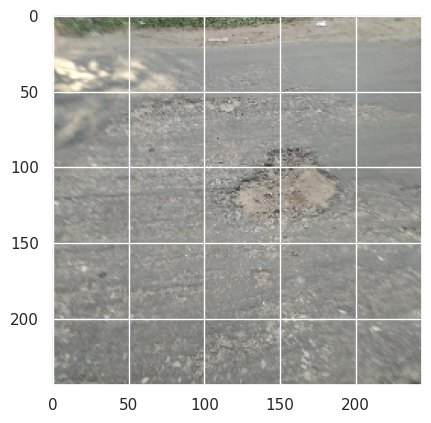

Predicted: Plain
1/1 [==============================] - 0s 19ms/step


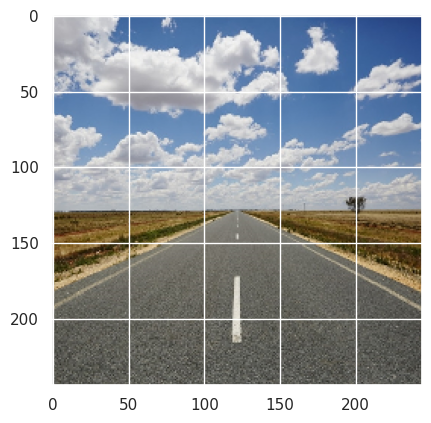

Predicted: Plain
1/1 [==============================] - 0s 28ms/step


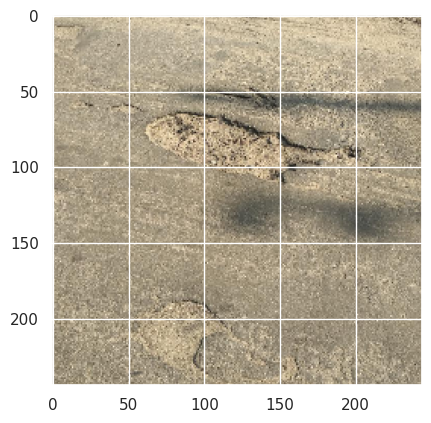

Predicted: Pothole
1/1 [==============================] - 0s 18ms/step


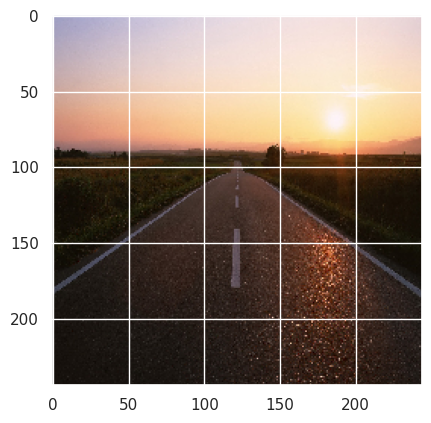

Predicted: Plain
1/1 [==============================] - 0s 19ms/step


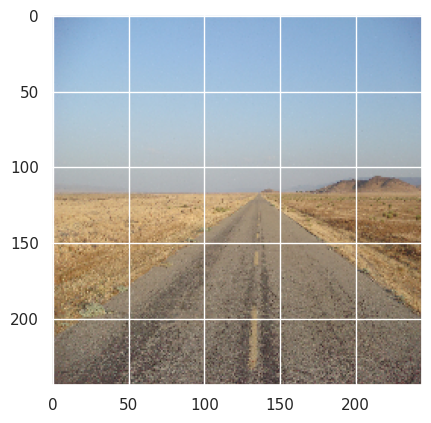

Predicted: Plain
1/1 [==============================] - 0s 26ms/step


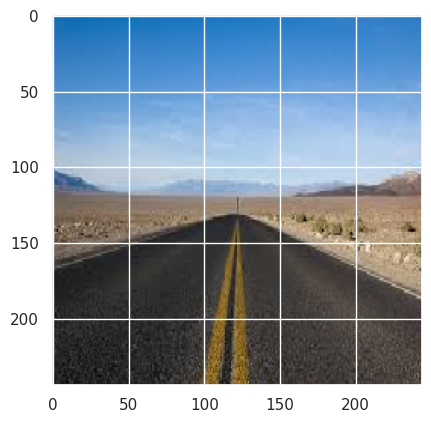

Predicted: Plain
1/1 [==============================] - 0s 29ms/step


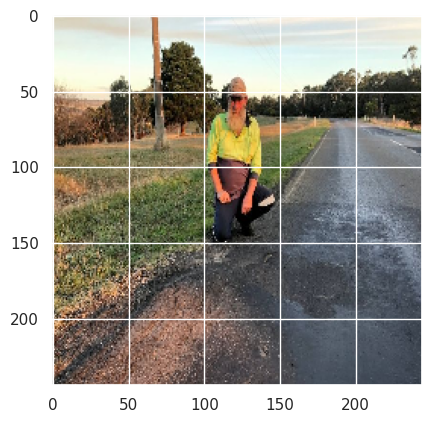

Predicted: Plain
1/1 [==============================] - 0s 25ms/step


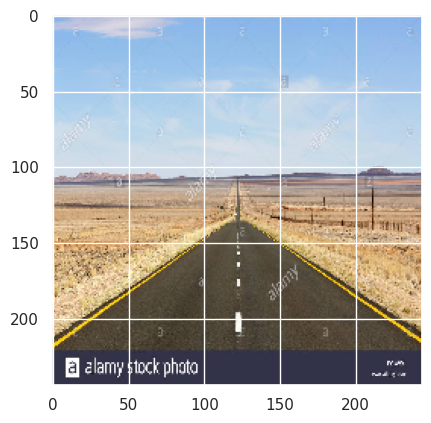

Predicted: Plain
1/1 [==============================] - 0s 32ms/step


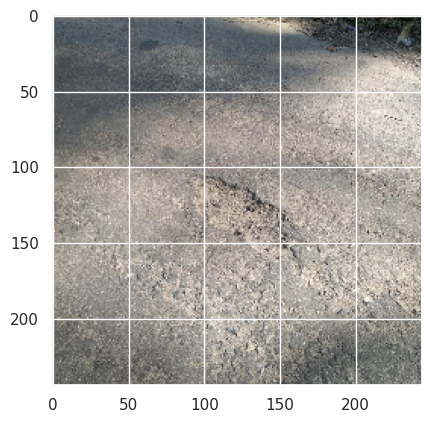

Predicted: Pothole
1/1 [==============================] - 0s 52ms/step


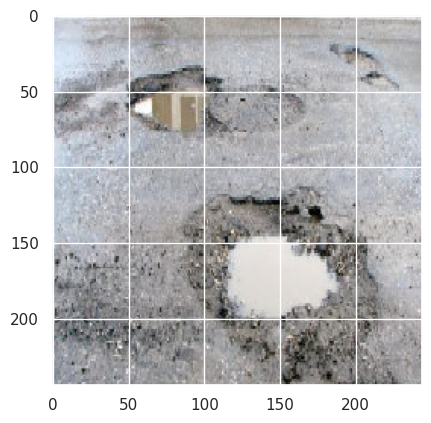

Predicted: Pothole
1/1 [==============================] - 0s 42ms/step


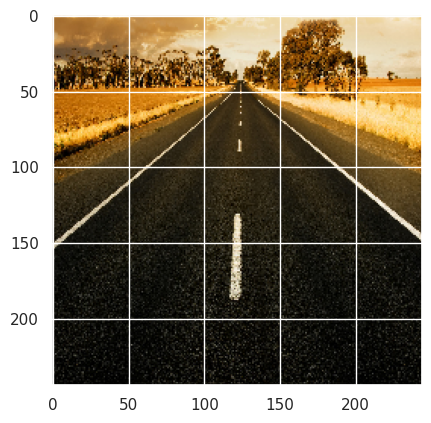

Predicted: Plain
1/1 [==============================] - 0s 63ms/step


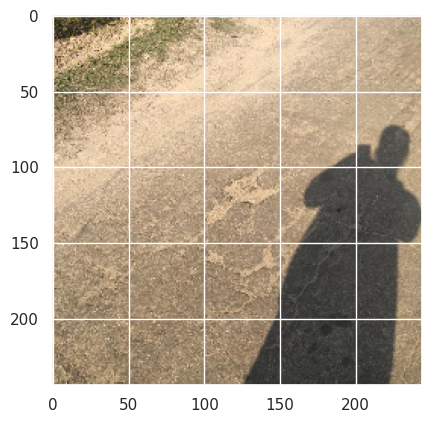

Predicted: Pothole
1/1 [==============================] - 0s 35ms/step


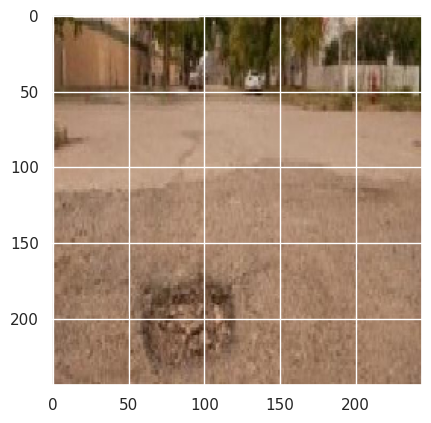

Predicted: Pothole
1/1 [==============================] - 0s 40ms/step


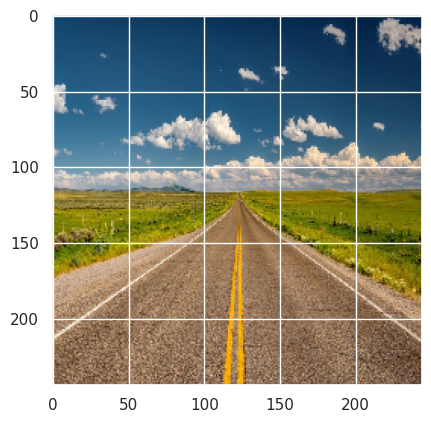

Predicted: Plain
1/1 [==============================] - 0s 34ms/step


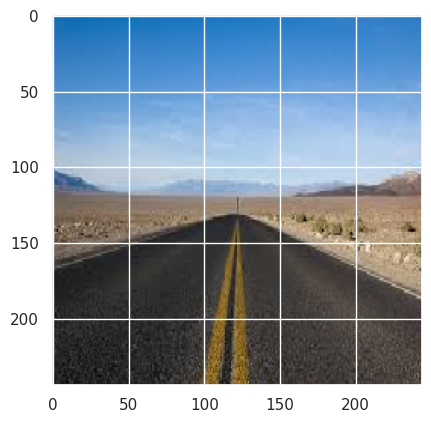

Predicted: Plain
1/1 [==============================] - 0s 31ms/step


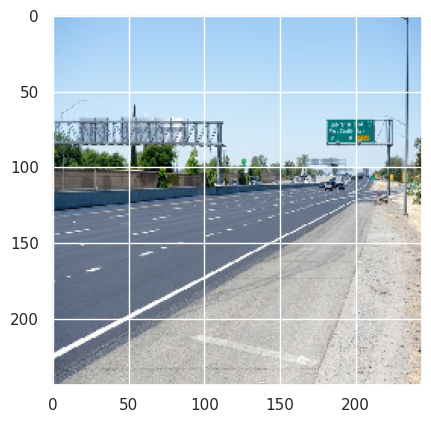

Predicted: Plain
1/1 [==============================] - 0s 34ms/step


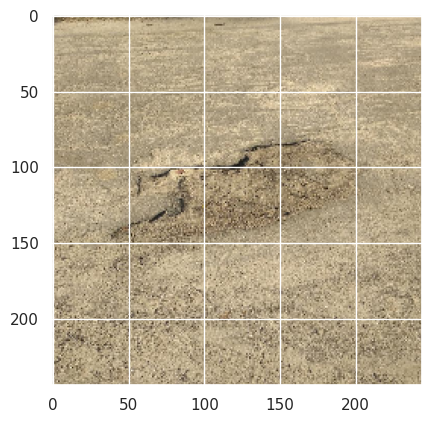

Predicted: Plain
1/1 [==============================] - 0s 36ms/step


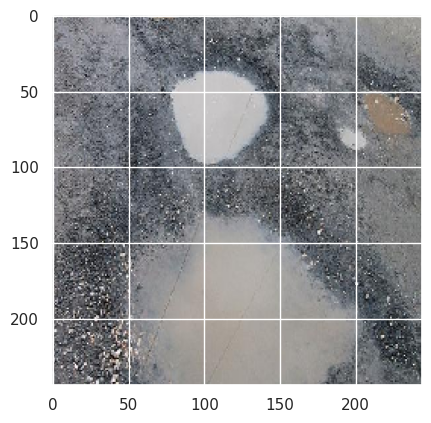

Predicted: Pothole
1/1 [==============================] - 0s 38ms/step


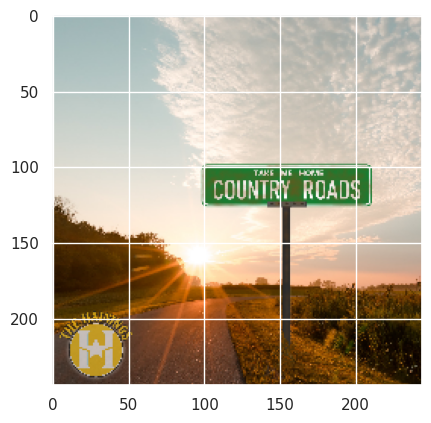

Predicted: Plain
1/1 [==============================] - 0s 29ms/step


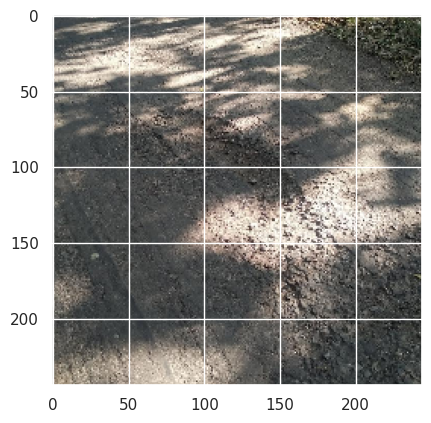

Predicted: Pothole
1/1 [==============================] - 0s 28ms/step


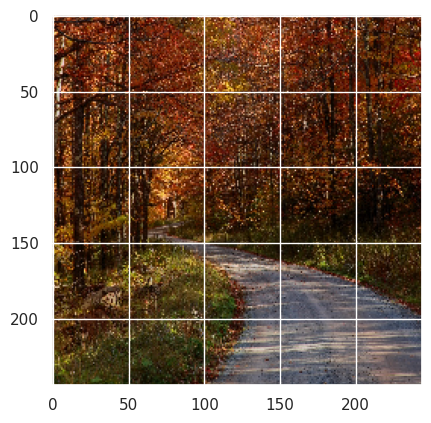

Predicted: Plain
1/1 [==============================] - 0s 27ms/step


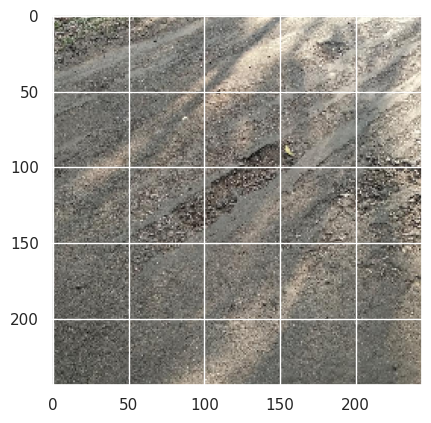

Predicted: Pothole
1/1 [==============================] - 0s 28ms/step


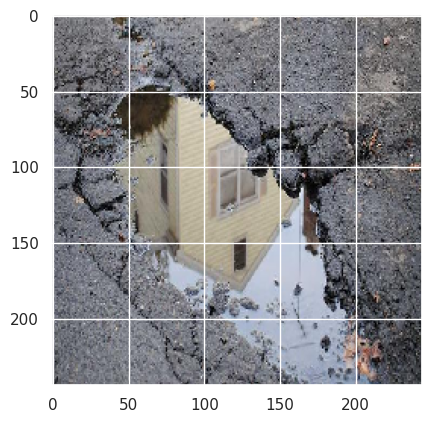

Predicted: Pothole
1/1 [==============================] - 0s 26ms/step


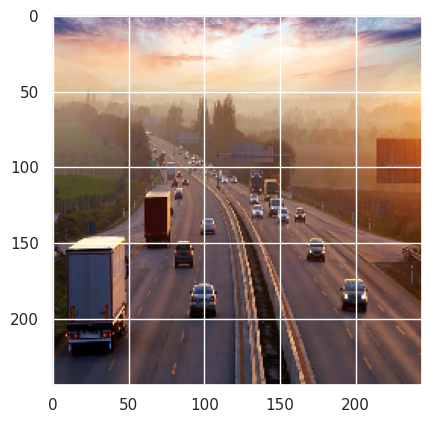

Predicted: Plain
1/1 [==============================] - 0s 20ms/step


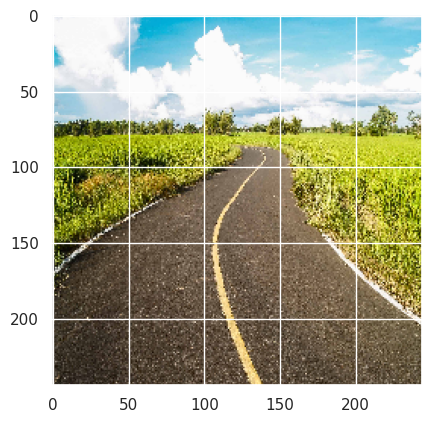

Predicted: Plain
1/1 [==============================] - 0s 28ms/step


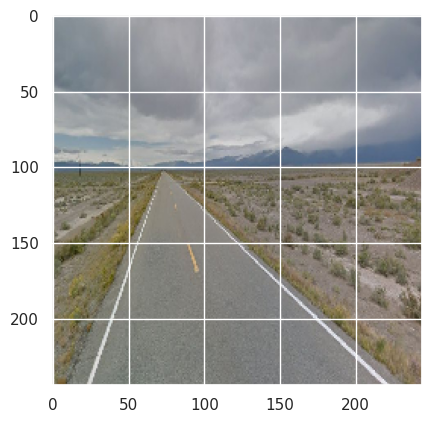

Predicted: Plain
1/1 [==============================] - 0s 29ms/step


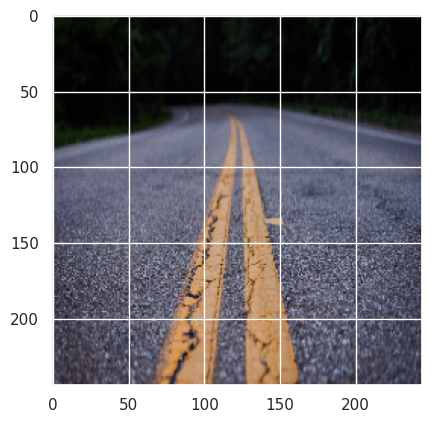

Predicted: Plain
1/1 [==============================] - 0s 27ms/step


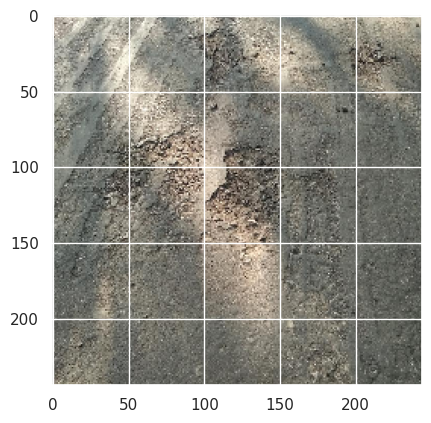

Predicted: Pothole
1/1 [==============================] - 0s 29ms/step


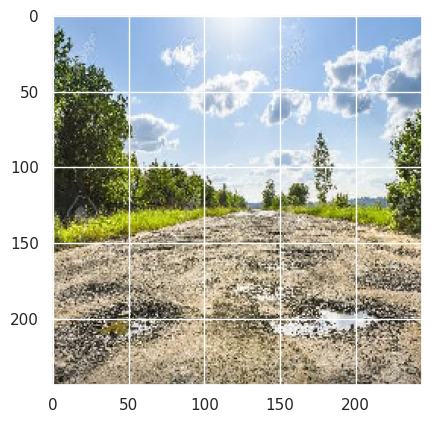

Predicted: Plain
1/1 [==============================] - 0s 28ms/step


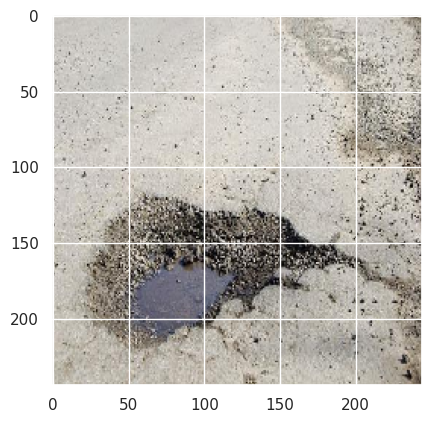

Predicted: Pothole
1/1 [==============================] - 0s 29ms/step


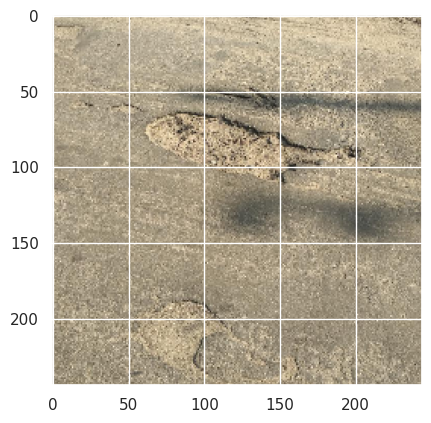

Predicted: Pothole
1/1 [==============================] - 0s 27ms/step


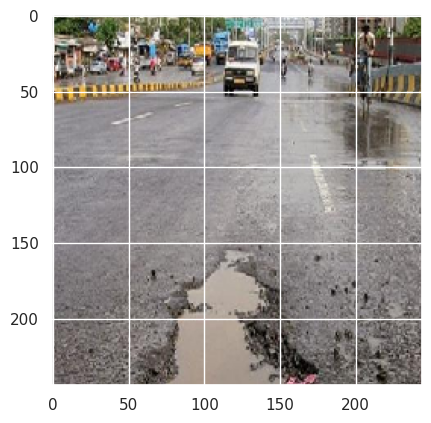

Predicted: Plain
1/1 [==============================] - 0s 29ms/step


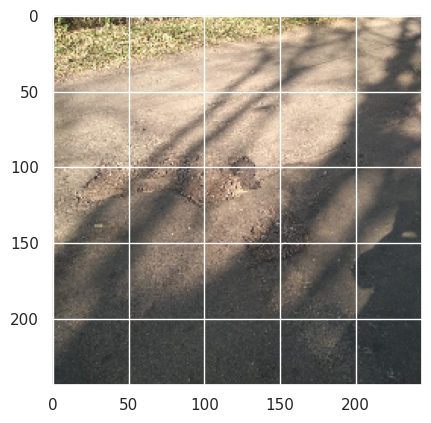

Predicted: Pothole
1/1 [==============================] - 0s 27ms/step


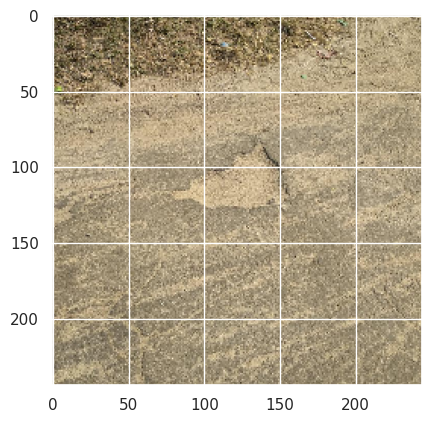

Predicted: Pothole
1/1 [==============================] - 0s 27ms/step


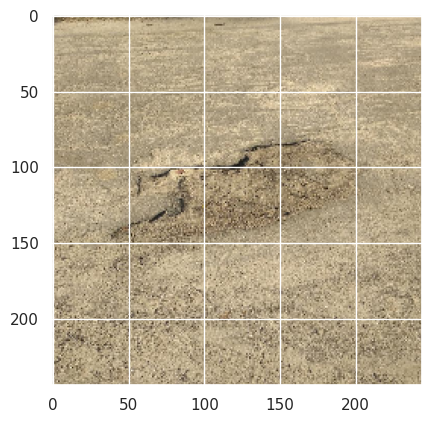

Predicted: Plain
1/1 [==============================] - 0s 27ms/step


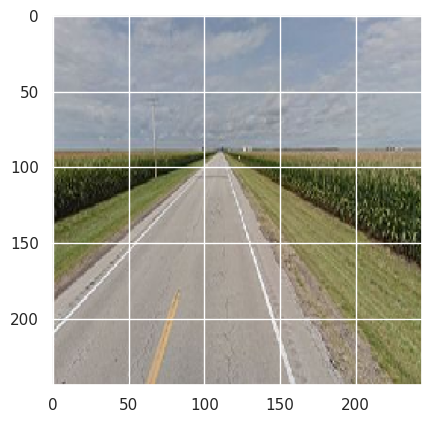

Predicted: Plain
1/1 [==============================] - 0s 96ms/step


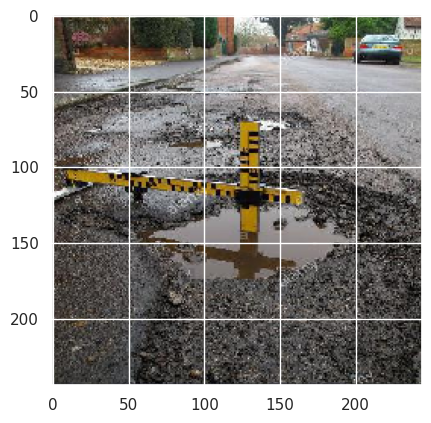

Predicted: Pothole
1/1 [==============================] - 0s 93ms/step


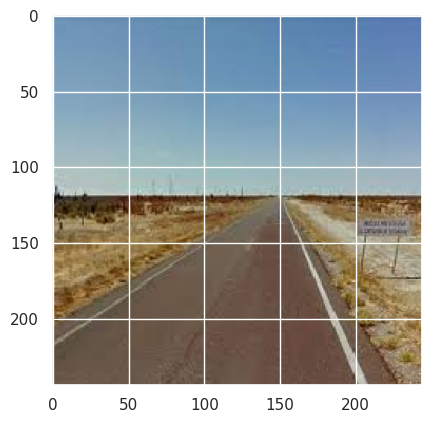

Predicted: Plain
1/1 [==============================] - 0s 80ms/step


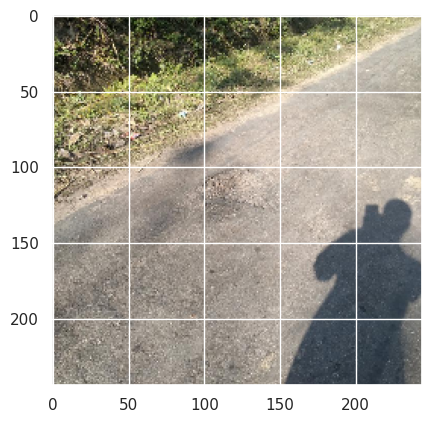

Predicted: Pothole
1/1 [==============================] - 0s 137ms/step


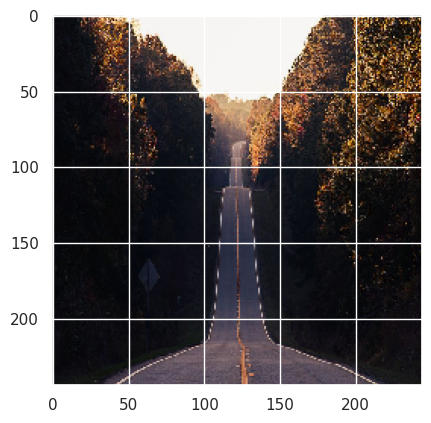

Predicted: Plain
1/1 [==============================] - 0s 73ms/step


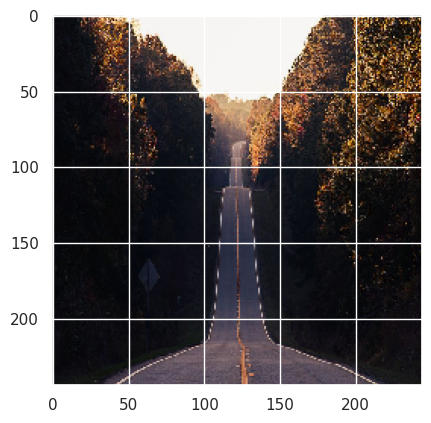

Predicted: Plain
1/1 [==============================] - 0s 123ms/step


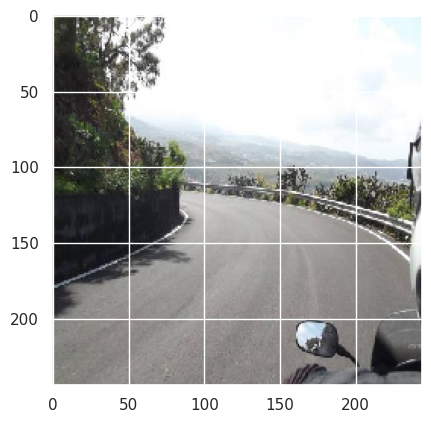

Predicted: Plain
1/1 [==============================] - 0s 136ms/step


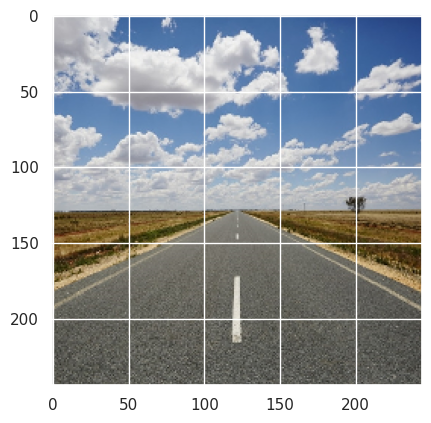

Predicted: Plain
1/1 [==============================] - 0s 155ms/step


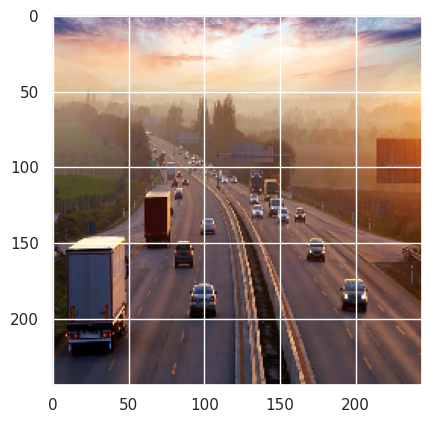

Predicted: Plain
1/1 [==============================] - 0s 27ms/step


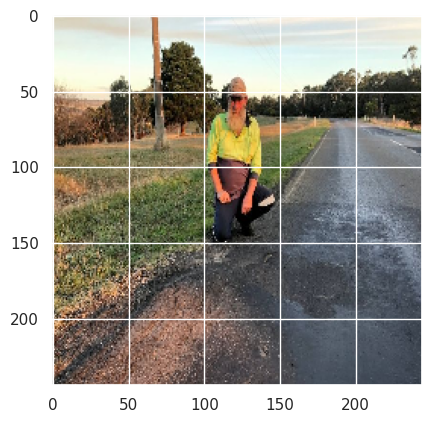

Predicted: Plain
1/1 [==============================] - 0s 32ms/step


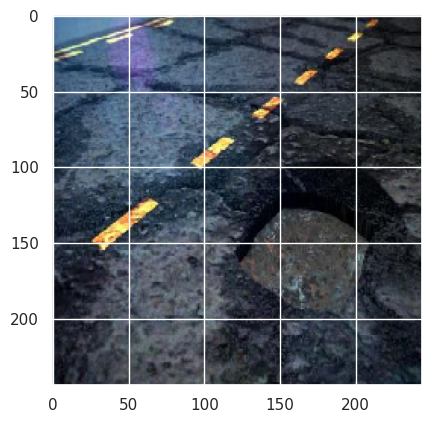

Predicted: Plain


In [ ]:
from keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
import os
import random

def visualize_predictions(classifier, n_cases, class_names):
    for i in range(n_cases):
        path = random.choice(['/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test/test_plain', '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test/test_pothole'])

        random_img = random.choice(os.listdir(path))
        img_path = os.path.join(path, random_img)
        img = image.load_img(img_path, target_size=(244, 244))
        img_tensor = image.img_to_array(img)
        img_tensor = np.expand_dims(img_tensor, axis=0)
        img_tensor = preprocess_input(img_tensor)  # Make sure to match the preprocessing of VGG16

        prediction = classifier.predict(img_tensor)
        prediction = np.argmax(prediction, axis=1)

        plt.imshow(img)
        plt.show()

        print(f"Predicted: {class_names[prediction[0]]}")

# Example usage, assuming class_names are defined (e.g., class_names = ['Plain', 'Pothole'])
visualize_predictions(model, 50, ['Plain', 'Pothole'])


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from keras.applications.vgg16 import preprocess_input

def gather_predictions(classifier, test_dir, n_cases, class_names):
    predictions = []
    true_labels = []

    for _ in range(n_cases):
        for class_index, class_name in enumerate(class_names):
            path = os.path.join(test_dir, class_name.lower())
            random_img = random.choice(os.listdir(path))
            img_path = os.path.join(path, random_img)
            img = image.load_img(img_path, target_size=(244, 244))
            img_tensor = image.img_to_array(img)
            img_tensor = np.expand_dims(img_tensor, axis=0)
            img_tensor = preprocess_input(img_tensor)

            pred = classifier.predict(img_tensor)
            pred_class = np.argmax(pred, axis=1)[0]

            predictions.append(pred_class)
            true_labels.append(class_index)  # Assumes directories are named after class names

    return true_labels, predictions

# Example usage
true_labels, predictions = gather_predictions(model, '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test', 130, ['test_Plain', 'test_Pothole'])


1/1 [==============================] - 0s 18ms/step


Precision: 1.0
Recall: 0.823076923076923
F1 Score: 0.9029535864978903
Accuracy: 0.9115384615384615


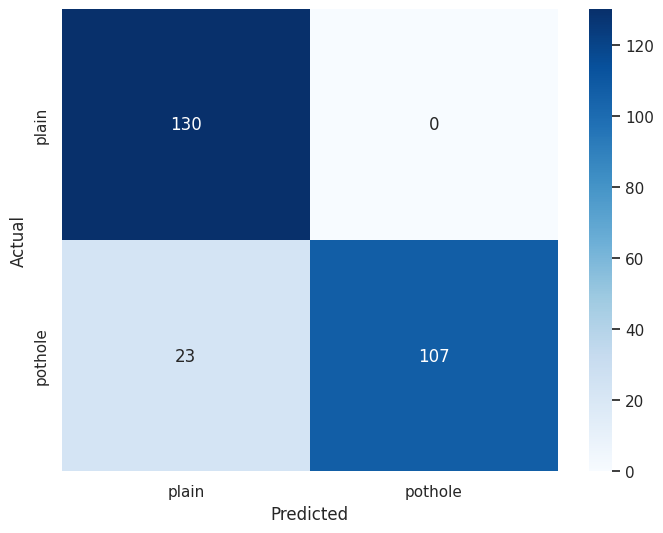

In [ ]:
# Calculate precision, recall, F1 score, and accuracy
precision = precision_score(true_labels, predictions)
recall = recall_score(true_labels, predictions)
f1 = f1_score(true_labels, predictions)
accuracy = accuracy_score(true_labels, predictions)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {accuracy}")

# Generate and display a confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()
